# 00a — City Boundary & 1 km Grid Generation

## Overview

This notebook generates two geospatial outputs for every city in the project:

1. **City boundary** — a single dissolved polygon representing the full urban extent,
   clipped to remove sea and large lake areas
2. **1 km × 1 km grid** — a regular square grid clipped to that land-only boundary

Both outputs are used in all downstream notebooks as the spatial reference frame for
population, pollution, land use, and transport data.

---

## Workflow

```
For each city
    │
    ├── Does a local boundary file exist at data/raw/{city}/city_boundary/?
    │       YES → read from local GeoPackage
    │       NO  → download from OpenStreetMap via OSM relation ID
    │
    └── Dissolve to single polygon (EPSG:4326)
         │
         └── Clip to land mass (ne_10m_land.gpkg) → remove sea areas
              │
              └── Remove large lakes (ne_10m_lakes.gpkg)
                   │
                   └── Save cleaned land-only boundary
                        │
                        └── Project to UTM CRS (from config.py: CITY_CRS)
                             │
                             └── Generate regular 1 km × 1 km grid
                                  │
                                  └── Clip to boundary, remove slivers < MIN_AREA_M2
                                       │
                                       └── Add centroid lon/lat → export all outputs
```

---

## Output Structure

Outputs are written per city under `data/raw/` (boundary) and `data/processed/` (grid):

```
data/
├── raw/
│   └── {city}/
│       └── city_boundary/
│           ├── {city}_boundary.gpkg        ← raw dissolved boundary (local or OSM)
│           ├── {city}_boundary.geojson
│           ├── {city}_boundary_clipped.gpkg     ← land-only boundary (sea + lakes removed)
│           └── {city}_boundary_clipped.geojson
└── processed/
    └── {city}/grid
               ├── grid_{city}_1km.gpkg            ← 1 km grid clipped to land-only boundary
               ├── grid_{city}_1km.geojson
               ├── grid_{city}_1km_centroids.csv   ← centroid lon/lat per cell (no geometry)
               ├── {city}_1km_grid_map.png         ← basemap figure
               └── {city}_1km_grid_map.pdf
```

---

## Prerequisites

- `src/config.py` must be on the Python path and must contain `CITY_CRS: dict[str, str]`
  mapping every city slug to its projected UTM CRS.
- The following Natural Earth reference files must be placed in `data/raw/ne/`:
  - `ne_10m_land.gpkg` — world land mass polygons (used to remove sea areas)
  - `ne_10m_lakes.gpkg` — world lakes polygons (used to remove large lakes)
  Both files are available at: https://www.naturalearthdata.com/downloads/10m-physical-vectors/
- For cities with a **local boundary file**, place it at:
  `data/raw/{city}/city_boundary/{city}_boundary.gpkg`
  Cities without a local file will be downloaded from OSM automatically.

---

## Cities Covered

| Slug | Label | OSM Relation ID | CRS |
|---|---|---|---|
| `abuja` | Abuja | 3717265 | EPSG:32632 |
| `algiers` | Algiers | 157062 | EPSG:32631 |
| `baghdad` | Baghdad | 3242293 | EPSG:32638 |
| `buenos_aires` | Buenos Aires | 1224652 | EPSG:32721 |
| `cairo` | Cairo | 5765086 | EPSG:32636 |
| `cape_town` | Cape Town | 79604 | EPSG:32734 |
| `dakar` | Dakar | 2892079 | EPSG:32628 |
| `lima` | Lima | 12933390 | EPSG:32718 |
| `los_angeles` | Los Angeles | 396479 | EPSG:32611 |
| `madrid` | Madrid | 349055 | EPSG:32630 |
| `mexico_city` | Mexico City | 16948653 | EPSG:32614 |
| `mumbai` | Mumbai | 13312356 | EPSG:32643 |
| `new_york` | New York | 175905 | EPSG:32618 |
| `santiago` | Santiago | 198848 | EPSG:32719 |
| `yangon` | Yangon | 1949679 | EPSG:32647 |

Cities with a local boundary file at the expected path will use that file instead
of the OSM relation ID.

## 1. Setup & Configuration

In [1]:
# !pip install osmnx geopandas shapely pyproj pandas matplotlib contextily -q

In [ ]:
from pathlib import Path
import sys
import shutil
import osmnx as ox
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import contextily as ctx
from shapely.geometry import box

try:
    from shapely.validation import make_valid as shapely_make_valid
except ImportError:
    # Shapely < 1.8 fallback: buffer(0) is used instead in make_valid_gdf()
    shapely_make_valid = None

# ── Project root & src path ───────────────────────────────────────────────────
# Assumes this notebook lives inside ./notebooks/. Adjust PROJECT_ROOT if needed.
current_path = Path.cwd().resolve()
PROJECT_ROOT = current_path.parent if current_path.name == "notebooks" else current_path

# Add src/ to the Python path so config.py can be imported
SRC_DIR = PROJECT_ROOT / "src"
if str(SRC_DIR) not in sys.path:
    sys.path.insert(0, str(SRC_DIR))

# ── Import shared CRS mapping from config ─────────────────────────────────────
# CITY_CRS maps every city slug to its projected UTM CRS (metre-based).
# Falls back to an inline copy if config.py is not found.
try:
    from config import CITY_CRS
    print("Loaded CITY_CRS from src/config.py")
except ImportError:
    print("WARNING: src/config.py not found — using inline fallback CITY_CRS.")
    CITY_CRS = { ## If not found in config.py, these are considered as fallback CRS for the cities.
        # "abuja"        : "EPSG:32632",  # UTM 32N
        # "algiers"      : "EPSG:32631",  # UTM 31N
        # "baghdad"      : "EPSG:32638",  # UTM 38N
        # "buenos_aires" : "EPSG:32721",  # UTM 21S
        # "cairo"        : "EPSG:32636",  # UTM 36N
        # "cape_town"    : "EPSG:32734",  # UTM 34S
        # "dakar"        : "EPSG:32628",  # UTM 28N
        # "lima"         : "EPSG:32718",  # UTM 18S
        # "los_angeles"  : "EPSG:32611",  # UTM 11N
        # "madrid"       : "EPSG:32630",  # UTM 30N
        # "mexico_city"  : "EPSG:32614",  # UTM 14N
        # "mumbai"       : "EPSG:32643",  # UTM 43N
        # "new_york"     : "EPSG:32618",  # UTM 18N
        # "santiago"     : "EPSG:32719",  # UTM 19S
        # "yangon"       : "EPSG:32647",  # UTM 47N
        # "cebu"         : "EPSG:32651",  # UTM 51N
        # "nairobi"      : "EPSG:32637",  # UTM 37N
        # "barcelona"    : "EPSG:32631",  # UTM 31N
    }

# ── Data directories ──────────────────────────────────────────────────────────
# Per-city subdirectories are created dynamically during processing.
RAW_DIR       = PROJECT_ROOT / "data" / "raw"
PROCESSED_DIR = PROJECT_ROOT / "data" / "processed"

RAW_DIR.mkdir(parents=True, exist_ok=True)
PROCESSED_DIR.mkdir(parents=True, exist_ok=True)

# ── Natural Earth reference files ───────────────────────────────────────────────
# Used by clip_boundary_to_land() to remove sea and lake areas from city boundaries.
# Download from: https://www.naturalearthdata.com/downloads/10m-physical-vectors/
# Place both files in data/raw/ne/ before running the notebook.
NE_DIR       = PROJECT_ROOT / "data" / "aux" / "ne"
NE_LAND_PATH  = NE_DIR / "ne_10m_land.gpkg"
NE_LAKES_PATH = NE_DIR / "ne_10m_lakes.gpkg"

NE_DIR.mkdir(parents=True, exist_ok=True)

# Warn if NE files are missing so the user knows before the batch run fails
for ne_path in [NE_LAND_PATH, NE_LAKES_PATH]:
    if not ne_path.exists():
        print(f"⚠️  Missing Natural Earth file: {ne_path.relative_to(PROJECT_ROOT)}")
    else:
        print(f"✅ Found: {ne_path.relative_to(PROJECT_ROOT)}")

# ── OSMnx settings ────────────────────────────────────────────────────────────
ox.settings.timeout   = 300   # seconds before an OSM request times out
ox.settings.use_cache = True  # cache OSM downloads — repeated runs are fast

print(f"Project root  : {PROJECT_ROOT}")
print(f"Raw data dir  : {RAW_DIR}")
print(f"Processed dir : {PROCESSED_DIR}")
print(f"Cities in CITY_CRS: {sorted(CITY_CRS.keys())}")

Loaded CITY_CRS from src/config.py
✅ Found: data/aux/ne/ne_10m_land.gpkg
✅ Found: data/aux/ne/ne_10m_lakes.gpkg
Project root  : /Users/sergimarsol/Documentos/0. UNIVERSITAT/1. Imperial/4. Group Design Project/WB Project
Raw data dir  : /Users/sergimarsol/Documentos/0. UNIVERSITAT/1. Imperial/4. Group Design Project/WB Project/data/raw
Processed dir : /Users/sergimarsol/Documentos/0. UNIVERSITAT/1. Imperial/4. Group Design Project/WB Project/data/processed
Cities in CITY_CRS: ['abuja', 'algiers', 'baghdad', 'barcelona', 'buenos_aires', 'cairo', 'cape_town', 'cebu', 'dakar', 'lima', 'los_angeles', 'madrid', 'mexico_city', 'mumbai', 'nairobi', 'new_york', 'santiago', 'yangon']


## 2. City Configuration

`CITIES` is the single source of truth for all cities processed by this notebook.
Each entry maps a city slug to its display label and OSM relation ID.
The projected CRS is pulled from `CITY_CRS` in `config.py`.

**Boundary source priority** (resolved at runtime in Section 4):

1. If `data/raw/{city}/city_boundary/{city}_boundary.gpkg` exists → use local file
2. Otherwise → download from OSM using the configured relation ID

To override the boundary for a city, simply place a `.gpkg` file at the expected
path before running the notebook.

In [ ]:
# ── Grid parameters ───────────────────────────────────────────────────────────
CELL_SIZE_M = 1_000    # grid cell side length in metres (1 km × 1 km)
MIN_AREA_M2 = 100_000  # minimum retained cell area after boundary clipping;
                        # removes thin slivers at city edges (~10% of a full cell)
RESET_BOUNDARIES = False  # if True, deletes all existing local boundary files to force OSM re-download and re-processing (use with caution!)
# ── City registry ─────────────────────────────────────────────────────────────
# Keys are city slugs used in all file and directory names: https://osm-boundaries.com/map
# OSM relation IDs can be verified at: https://www.openstreetmap.org/relation/<id>
CITIES = {
    "abuja"        : {"label": "Abuja",          "relation_id": "3717265" },
    "algiers"      : {"label": "Algiers",        "relation_id": "157062"  },
    "baghdad"      : {"label": "Baghdad",        "relation_id": "3242293" },
    "buenos_aires" : {"label": "Buenos Aires",   "relation_id": "1224652" },
    "cairo"        : {"label": "Cairo",          "relation_id": "5765086" },
    "cape_town"    : {"label": "Cape Town",      "relation_id": "79604"   },
    "dakar"        : {"label": "Dakar",          "relation_id": "2892079" },
    "lima"         : {"label": "Lima",           "relation_id": "12933390"},
    "los_angeles"  : {"label": "Los Angeles",    "relation_id": "396479"  },
    "madrid"       : {"label": "Madrid",         "relation_id": "349055"  },
    "mexico_city"  : {"label": "Mexico City",    "relation_id": "16948653"},
    "mumbai"       : {"label": "Mumbai",         "relation_id": "13312356"},
    "new_york"     : {"label": "New York",       "relation_id": "175905"  },
    "santiago"     : {"label": "Santiago",       "relation_id": "198848"  },
    "yangon"       : {"label": "Yangon",         "relation_id": "1949679" },
    #"cebu"    : {"label": "Cebu City", "relation_id": "1506936"},
    #"nairobi" : {"label": "Nairobi",   "relation_id": "3492709"},

}

# ── Path helpers ──────────────────────────────────────────────────────────────
def raw_boundary_dir(city_slug: str) -> Path:
    """Return the raw boundary directory for a city, creating it if needed."""
    p = RAW_DIR / city_slug / "city_boundary"
    p.mkdir(parents=True, exist_ok=True)
    return p

def processed_dir(city_slug: str) -> Path:
    """Return the processed output directory for a city, creating it if needed."""
    p = PROCESSED_DIR / city_slug / "grid"
    p.mkdir(parents=True, exist_ok=True)
    return p

def local_boundary_path(city_slug: str) -> Path:
    """Return the canonical local boundary GeoPackage path for a city."""
    return raw_boundary_dir(city_slug) / f"{city_slug}_boundary.gpkg"

# ── Preview expected paths ────────────────────────────────────────────────────
print(f"City registry: {len(CITIES)} cities")
print()
print(f"{'Slug':<15} {'Local boundary exists?':<24} {'Path'}")
print("-" * 80)
for slug in CITIES:
    lp     = local_boundary_path(slug)
    exists = "✅ yes" if lp.exists() else "— no (will use OSM)"
    print(f"  {slug:<13} {exists:<22}  {lp.relative_to(PROJECT_ROOT)}")


if RESET_BOUNDARIES:
    RAW_DIR = Path("../data/raw")

    for city_dir in sorted(RAW_DIR.iterdir()):
        boundary_dir = city_dir / "city_boundary"
        if boundary_dir.exists():
            shutil.rmtree(boundary_dir)
            print(f"  Deleted: {boundary_dir}")

    print("Done.")

City registry: 15 cities

Slug            Local boundary exists?   Path
--------------------------------------------------------------------------------
  abuja         ✅ yes                   data/raw/abuja/city_boundary/abuja_boundary.gpkg
  algiers       ✅ yes                   data/raw/algiers/city_boundary/algiers_boundary.gpkg
  baghdad       ✅ yes                   data/raw/baghdad/city_boundary/baghdad_boundary.gpkg
  buenos_aires  ✅ yes                   data/raw/buenos_aires/city_boundary/buenos_aires_boundary.gpkg
  cairo         ✅ yes                   data/raw/cairo/city_boundary/cairo_boundary.gpkg
  cape_town     ✅ yes                   data/raw/cape_town/city_boundary/cape_town_boundary.gpkg
  dakar         ✅ yes                   data/raw/dakar/city_boundary/dakar_boundary.gpkg
  lima          ✅ yes                   data/raw/lima/city_boundary/lima_boundary.gpkg
  los_angeles   ✅ yes                   data/raw/los_angeles/city_boundary/los_angeles_boundary.gpkg
  madr

## 3. Helper Functions

All spatial processing logic is defined here. Functions are kept granular so individual
steps can be inspected or rerun in isolation using Section 5.

In [ ]:
# ── Geometry utilities ────────────────────────────────────────────────────────

def ensure_relation_id(osm_relation_id: str) -> str:
    """
    Ensure the OSM relation ID is in the format OSMnx expects: 'R<number>'.
    Accepts both '175905' and 'R175905' as input.
    """
    relation = str(osm_relation_id).strip()
    return relation if relation.startswith("R") else f"R{relation}"


def make_valid_gdf(gdf: gpd.GeoDataFrame) -> gpd.GeoDataFrame:
    """
    Fix invalid geometries in a GeoDataFrame.
    Uses shapely.validation.make_valid if available (Shapely >= 1.8),
    otherwise falls back to buffer(0). Drops null and empty geometries.
    """
    gdf = gdf.copy()
    if shapely_make_valid is not None:
        gdf["geometry"] = gdf.geometry.apply(shapely_make_valid)
    else:
        gdf["geometry"] = gdf.geometry.buffer(0)
    return gdf[gdf.geometry.notna() & ~gdf.geometry.is_empty].copy()


def dissolve_to_single_boundary(gdf: gpd.GeoDataFrame, city_slug: str) -> gpd.GeoDataFrame:
    """
    Dissolve all features into a single city boundary polygon in EPSG:4326.
    Works whether the input has one or many rows (e.g. OSM may return
    multiple administrative sub-regions for one relation).
    """
    gdf = make_valid_gdf(gdf.to_crs("EPSG:4326"))

    # union_all() is the Shapely >= 2.0 API; unary_union is the fallback
    merged_geom = (
        gdf.geometry.union_all()
        if hasattr(gdf.geometry, "union_all")
        else gdf.unary_union
    )

    return make_valid_gdf(gpd.GeoDataFrame(
        {"city": [city_slug]},
        geometry=[merged_geom],
        crs="EPSG:4326",
    ))


# ── Export utilities ───────────────────────────────────────────────────────────

def export_gdf(gdf: gpd.GeoDataFrame, out_dir: Path, stem: str) -> dict:
    """
    Export a GeoDataFrame to both GeoPackage (.gpkg) and GeoJSON (.geojson).
    Returns a dict of {'gpkg': Path, 'geojson': Path}.
    """
    gpkg_path    = out_dir / f"{stem}.gpkg"
    geojson_path = out_dir / f"{stem}.geojson"
    gdf.to_file(gpkg_path,    driver="GPKG")
    gdf.to_file(geojson_path, driver="GeoJSON")
    print(f"    Saved: {gpkg_path.relative_to(PROJECT_ROOT)}")
    print(f"    Saved: {geojson_path.relative_to(PROJECT_ROOT)}")
    return {"gpkg": gpkg_path, "geojson": geojson_path}


# ── Centroid computation ───────────────────────────────────────────────────────

def add_centroids(grid_gdf: gpd.GeoDataFrame, projected_crs: str) -> gpd.GeoDataFrame:
    """
    Add centroid_lon and centroid_lat columns to a grid GeoDataFrame.
    Centroids are computed in the projected CRS (metres) for accuracy,
    then converted to WGS84 decimal degrees. The geometry column is not changed.
    """
    grid = grid_gdf.copy()
    centroids_wgs84 = grid.to_crs(projected_crs).centroid.to_crs("EPSG:4326")
    grid["centroid_lon"] = centroids_wgs84.x
    grid["centroid_lat"] = centroids_wgs84.y
    return grid


# ── Boundary acquisition ───────────────────────────────────────────────────────

def get_boundary(city_slug: str, relation_id: str) -> tuple[gpd.GeoDataFrame, str]:
    """
    Acquire a city boundary, preferring a local GeoPackage file over OSM download.

    Priority:
        1. data/raw/{city}/city_boundary/{city}_boundary.gpkg  → read local file
        2. OSM relation ID                                      → download via OSMnx

    Returns:
        boundary (GeoDataFrame in EPSG:4326), source ('local' or 'osm')

    The boundary is always dissolved to a single polygon and exported to the
    raw boundary directory so subsequent runs can reuse it without re-downloading.
    """
    local_path = local_boundary_path(city_slug)
    out_dir    = raw_boundary_dir(city_slug)

    if local_path.exists():
        # ── Local file path ────────────────────────────────────────────────────
        print(f"  Boundary source : LOCAL  ({local_path.relative_to(PROJECT_ROOT)})")
        raw = gpd.read_file(local_path)
        boundary = dissolve_to_single_boundary(raw, city_slug)
        source = "local"
    else:
        # ── OSM download path ──────────────────────────────────────────────────
        relation = ensure_relation_id(relation_id)
        print(f"  Boundary source : OSM    (relation {relation})")
        raw = ox.geocode_to_gdf(relation, by_osmid=True)
        boundary = dissolve_to_single_boundary(raw, city_slug)
        source = "osm"

    # Always write the raw dissolved boundary to the raw directory so it can be
    # reused as a local file on subsequent runs (avoids re-downloading from OSM)
    print(f"  Exporting boundary →")
    export_gdf(boundary, out_dir, f"{city_slug}_boundary")

    # ── Clip to land mass and remove large lakes ───────────────────────────────
    # The clipped boundary is what the grid generation uses so that 1 km cells
    # do not cover sea or large lake areas.
    print(f"  Clipping boundary to land →")
    boundary_clipped = clip_boundary_to_land(boundary, city_slug)

    return boundary_clipped, source


# ── Sea & lake clipping ────────────────────────────────────────────────────────

def clip_boundary_to_land(
    boundary_gdf : gpd.GeoDataFrame,
    city_slug    : str,
) -> gpd.GeoDataFrame:
    """
    Remove sea and large lake areas from a city boundary polygon.

    Uses two Natural Earth 1:10m physical vector datasets:
        - ne_10m_land.gpkg  : world land mass — clips out any ocean/sea area
        - ne_10m_lakes.gpkg : world lakes     — removes large inland water bodies

    The clipping is spatially efficient: both layers are first filtered to a
    bounding box slightly larger than the city boundary (0.5° padding) before
    the overlay operations, avoiding full global-scale intersections.

    Steps:
        1. Intersect boundary with land mass  → keep only land areas.
        2. Find lakes overlapping the result  → identify water bodies to remove.
        3. Subtract lakes from land boundary  → final land-only boundary.
        4. Export clipped boundary to raw city boundary directory.

    Returns:
        Clipped GeoDataFrame in EPSG:4326.
        If either NE file is missing, logs a warning and returns the original
        boundary unchanged so the pipeline can still proceed.
    """
    # ── Guard: check NE files are present ─────────────────────────────────────
    if not NE_LAND_PATH.exists() or not NE_LAKES_PATH.exists():
        print(f"  ⚠️  Clipping skipped for {city_slug}: Natural Earth files not found.")
        print(f"      Expected: {NE_LAND_PATH.relative_to(PROJECT_ROOT)}")
        print(f"               {NE_LAKES_PATH.relative_to(PROJECT_ROOT)}")
        return boundary_gdf

    boundary = make_valid_gdf(boundary_gdf.to_crs("EPSG:4326"))

    # ── Bounding box filter for spatial efficiency ─────────────────────────────
    # Expand by 0.5° to avoid edge artefacts from the overlay intersection
    minx, miny, maxx, maxy = boundary.total_bounds
    bbox_filter = (minx - 0.5, miny - 0.5, maxx + 0.5, maxy + 0.5)

    # ── Step 1: Load land mass filtered to bbox and intersect ─────────────────
    land = gpd.read_file(NE_LAND_PATH, bbox=bbox_filter)
    land["geometry"] = land.geometry.make_valid()
    land = land.to_crs("EPSG:4326")
    print(f"  Land polygons in bbox : {len(land)}")

    boundary_on_land = gpd.overlay(
        boundary, land, how="intersection", keep_geom_type=True
    )
    boundary_on_land["geometry"] = boundary_on_land.geometry.make_valid()
    boundary_on_land = make_valid_gdf(boundary_on_land)
    print(f"  After sea removal     : {len(boundary_on_land)} polygon(s)")

    # ── Step 2: Load lakes filtered to bbox ───────────────────────────────────
    lakes = gpd.read_file(NE_LAKES_PATH, bbox=bbox_filter)
    lakes["geometry"] = lakes.geometry.make_valid()
    lakes = lakes.to_crs("EPSG:4326")
    print(f"  Lake polygons in bbox : {len(lakes)}")

    # ── Step 3: Subtract lakes from land boundary ─────────────────────────────
    if len(lakes) > 0:
        lakes_in_boundary = gpd.overlay(
            lakes, boundary_on_land, how="intersection", keep_geom_type=True
        )
        if len(lakes_in_boundary) > 0:
            trimmed = gpd.overlay(
                boundary_on_land, lakes_in_boundary,
                how="difference", keep_geom_type=True
            )
            trimmed["geometry"] = trimmed.geometry.make_valid()
            trimmed = make_valid_gdf(trimmed)
            print(f"  After lake removal    : {len(trimmed)} polygon(s)  "
                  f"({len(lakes_in_boundary)} lake feature(s) subtracted)")
        else:
            trimmed = boundary_on_land.copy()
            print(f"  No lakes overlap boundary — land boundary unchanged.")
    else:
        trimmed = boundary_on_land.copy()
        print(f"  No lakes in bounding box — land boundary unchanged.")

    # ── Step 4: Export clipped boundary ───────────────────────────────────────
    out_dir = raw_boundary_dir(city_slug)
    print(f"  Exporting clipped boundary →")
    export_gdf(trimmed, out_dir, f"{city_slug}_boundary_clipped")

    return trimmed


# ── Grid generation ────────────────────────────────────────────────────────────

def create_regular_grid(
    boundary_gdf  : gpd.GeoDataFrame,
    city_slug     : str,
    projected_crs : str,
    cell_size     : int = CELL_SIZE_M,
    min_area_m2   : int = MIN_AREA_M2,
) -> gpd.GeoDataFrame:
    """
    Create a regular 1 km x 1 km (more generally, cell_size x cell_size) grid clipped to the city boundary.

    Steps:
        1. Project the boundary to the UTM CRS for metric accuracy.
        2. Build a complete grid over the bounding box.
        3. Clip to the boundary polygon via overlay intersection.
        4. Remove cells whose clipped area is below min_area_m2 (boundary slivers).
        5. Reproject back to WGS84 and add centroid columns.
        6. Export GeoPackage, GeoJSON, and centroid CSV to the processed directory.

    The spatial_id column uniquely identifies each cell as '{city}_{col:04d}_{row:04d}'.
    """
    out_dir = processed_dir(city_slug)

    # Project to UTM for metric operations
    boundary_proj = make_valid_gdf(
        make_valid_gdf(boundary_gdf.to_crs("EPSG:4326")).to_crs(projected_crs)
    )
    minx, miny, maxx, maxy = boundary_proj.total_bounds

    # Build the full bounding-box grid before clipping
    grid_cells, grid_ids = [], []
    col = 0
    x   = minx
    while x < maxx:
        row = 0
        y   = miny
        while y < maxy:
            grid_cells.append(box(x, y, x + cell_size, y + cell_size))
            grid_ids.append(f"{city_slug}_grid_{col:03d}_{row:03d}")
            y += cell_size; row += 1
        x += cell_size; col += 1

    grid = gpd.GeoDataFrame({"spatial_id": grid_ids}, geometry=grid_cells, crs=projected_crs)
    print(f"  Grid before clipping : {len(grid):,} cells")

    # Clip to city boundary and filter slivers
    grid_clipped            = gpd.overlay(grid, boundary_proj[["geometry"]], how="intersection")
    grid_clipped            = make_valid_gdf(grid_clipped)
    grid_clipped["area_m2"] = grid_clipped.geometry.area
    grid_clipped            = grid_clipped[grid_clipped["area_m2"] > min_area_m2].copy()
    n_removed               = len(grid) - len(grid_clipped)
    print(f"  Grid after clipping  : {len(grid_clipped):,} cells  "
          f"(removed {n_removed:,} slivers < {min_area_m2:,} m²)")

    # Reproject to WGS84 and attach centroid coordinates
    grid_wgs84 = add_centroids(grid_clipped.to_crs("EPSG:4326"), projected_crs)

    # Export spatial files
    print(f"  Exporting grid →")
    export_gdf(grid_wgs84, out_dir, f"grid_{city_slug}_1km")

    # Export centroid CSV (no geometry column — lightweight reference table)
    csv_path = out_dir / f"grid_{city_slug}_1km_centroids.csv"
    grid_wgs84.drop(columns="geometry").to_csv(csv_path, index=False)
    print(f"    Saved: {csv_path.relative_to(PROJECT_ROOT)}  ({len(grid_wgs84):,} rows)")

    return grid_wgs84


# ── Visualisation ──────────────────────────────────────────────────────────────

def plot_grid(
    boundary_gdf : gpd.GeoDataFrame,
    grid_gdf     : gpd.GeoDataFrame,
    city_slug    : str,
    label        : str,
    export       : bool = True,
) -> None:
    """
    Plot the city boundary and 1 km grid on an OpenStreetMap basemap.
    Exports PNG (300 dpi) and PDF to the processed directory if export=True.
    """
    out_dir = processed_dir(city_slug)

    # Reproject to Web Mercator for contextily basemap compatibility
    boundary_web = boundary_gdf.to_crs(epsg=3857)
    grid_web     = grid_gdf.to_crs(epsg=3857)

    fig, ax = plt.subplots(figsize=(10, 10))
    grid_web.boundary.plot(ax=ax, color="crimson",  linewidth=0.4, alpha=0.7)
    boundary_web.boundary.plot(ax=ax, color="black", linewidth=1.4)
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
    ax.set_title(f"{label} — 1 km × 1 km Grid  ({len(grid_gdf):,} cells)", fontsize=13)
    ax.set_axis_off()

    if export:
        png_path = out_dir / f"{city_slug}_1km_grid_map.png"
        pdf_path = out_dir / f"{city_slug}_1km_grid_map.pdf"
        fig.savefig(png_path, dpi=300, bbox_inches="tight")
        fig.savefig(pdf_path,           bbox_inches="tight")
        print(f"    Saved: {png_path.relative_to(PROJECT_ROOT)}")
        print(f"    Saved: {pdf_path.relative_to(PROJECT_ROOT)}")

    plt.show()
    plt.close(fig)


# ── Full pipeline wrapper ──────────────────────────────────────────────────────

def process_city(city_slug: str, config: dict, make_plot: bool = True) -> dict:
    """
    Run the full boundary acquisition + grid generation pipeline for one city.

    1. Acquire boundary: local file if present, otherwise OSM download.
    2. Clip boundary to land mass and remove large lakes (Natural Earth data).
    3. Generate 1 km grid clipped to the land-only boundary.
    4. Optionally plot and export a basemap figure.

    Returns a dict: {city, boundary (GDF), grid (GDF), source ('local'|'osm')}
    The boundary in the returned dict is the clipped (land-only) version.
    """
    projected_crs = CITY_CRS[city_slug]

    # Step 1: boundary
    boundary, source = get_boundary(city_slug, config["relation_id"])

    # Step 2: grid
    grid = create_regular_grid(boundary, city_slug, projected_crs)

    # Step 3: map
    if make_plot:
        print(f"  Generating map →")
        plot_grid(boundary, grid, city_slug, config["label"])

    return {"city": city_slug, "boundary": boundary, "grid": grid, "source": source}


print("All helper functions defined.")

All helper functions defined.


## 4. Run All Cities

Processes every city in `CITIES` sequentially. For each city:

1. Acquire boundary — local file if present, otherwise downloads from OSM
2. Clip boundary to land mass — removes sea and large lake areas using Natural Earth data
3. Generate 1 km grid — clipped to the land-only boundary
4. Optionally export a basemap figure

Set `MAKE_PLOTS = False` to skip basemap figure generation (faster, skips contextily).

**Note:** ensure `ne_10m_land.gpkg` and `ne_10m_lakes.gpkg` are in `data/raw/ne/`
before running. If missing, the clipping step is skipped with a warning and the
original boundary is used for grid generation.


  Abuja  [abuja]  CRS: EPSG:32632
  Boundary source : LOCAL  (data/raw/abuja/city_boundary/abuja_boundary.gpkg)
  Exporting boundary →
    Saved: data/raw/abuja/city_boundary/abuja_boundary.gpkg
    Saved: data/raw/abuja/city_boundary/abuja_boundary.geojson
  Clipping boundary to land →
  Land polygons in bbox : 1
  After sea removal     : 1 polygon(s)
  Lake polygons in bbox : 0
  No lakes in bounding box — land boundary unchanged.
  Exporting clipped boundary →
    Saved: data/raw/abuja/city_boundary/abuja_boundary_clipped.gpkg
    Saved: data/raw/abuja/city_boundary/abuja_boundary_clipped.geojson
  Grid before clipping : 3,360 cells
  Grid after clipping  : 1,859 cells  (removed 1,501 slivers < 100,000 m²)
  Exporting grid →
    Saved: data/processed/abuja/grid/grid_abuja_1km.gpkg
    Saved: data/processed/abuja/grid/grid_abuja_1km.geojson
    Saved: data/processed/abuja/grid/grid_abuja_1km_centroids.csv  (1,859 rows)
  Generating map →
    Saved: data/processed/abuja/grid/abuja_1k

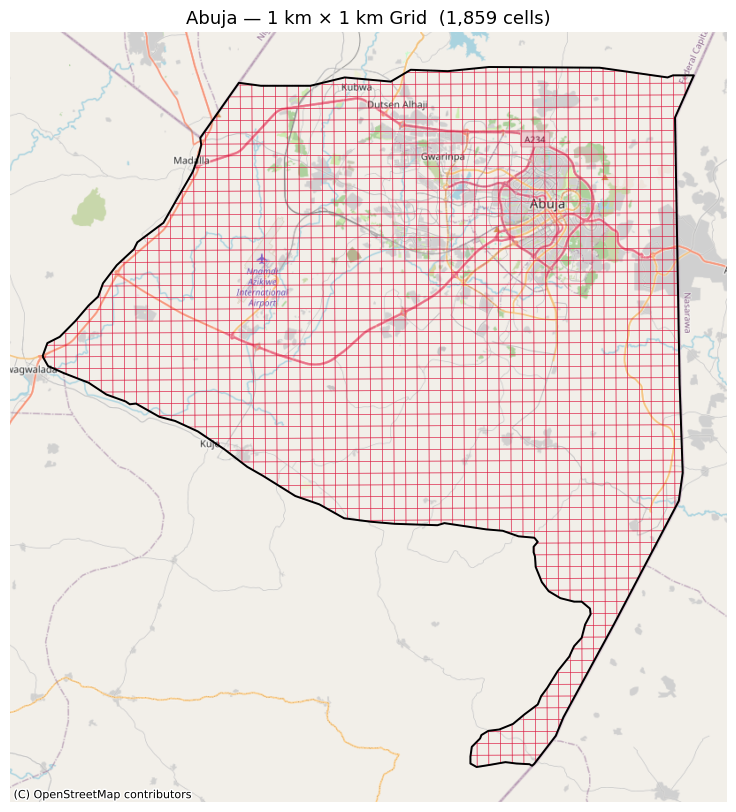

  ✅  Done — 1,859 grid cells  (boundary source: local)

  Algiers  [algiers]  CRS: EPSG:32631
  Boundary source : LOCAL  (data/raw/algiers/city_boundary/algiers_boundary.gpkg)
  Exporting boundary →
    Saved: data/raw/algiers/city_boundary/algiers_boundary.gpkg
    Saved: data/raw/algiers/city_boundary/algiers_boundary.geojson
  Clipping boundary to land →
  Land polygons in bbox : 1
  After sea removal     : 1 polygon(s)
  Lake polygons in bbox : 0
  No lakes in bounding box — land boundary unchanged.
  Exporting clipped boundary →
    Saved: data/raw/algiers/city_boundary/algiers_boundary_clipped.gpkg
    Saved: data/raw/algiers/city_boundary/algiers_boundary_clipped.geojson
  Grid before clipping : 1,431 cells
  Grid after clipping  : 814 cells  (removed 617 slivers < 100,000 m²)
  Exporting grid →
    Saved: data/processed/algiers/grid/grid_algiers_1km.gpkg
    Saved: data/processed/algiers/grid/grid_algiers_1km.geojson
    Saved: data/processed/algiers/grid/grid_algiers_1km_centr

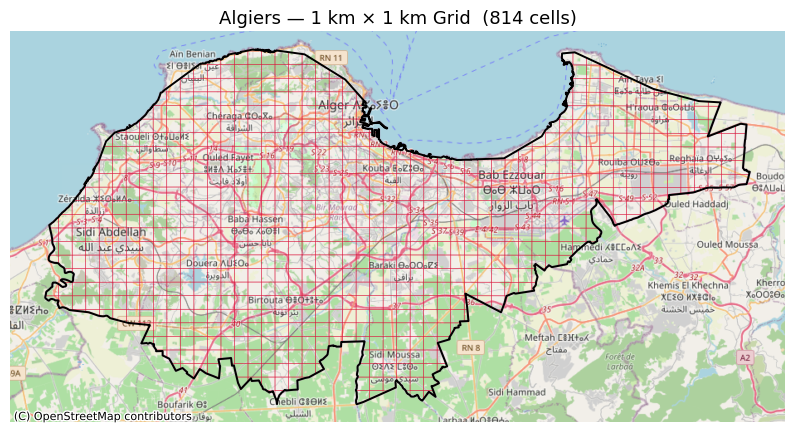

  ✅  Done — 814 grid cells  (boundary source: local)

  Baghdad  [baghdad]  CRS: EPSG:32638
  Boundary source : LOCAL  (data/raw/baghdad/city_boundary/baghdad_boundary.gpkg)
  Exporting boundary →
    Saved: data/raw/baghdad/city_boundary/baghdad_boundary.gpkg
    Saved: data/raw/baghdad/city_boundary/baghdad_boundary.geojson
  Clipping boundary to land →
  Land polygons in bbox : 1
  After sea removal     : 1 polygon(s)
  Lake polygons in bbox : 3
  No lakes overlap boundary — land boundary unchanged.
  Exporting clipped boundary →
    Saved: data/raw/baghdad/city_boundary/baghdad_boundary_clipped.gpkg
    Saved: data/raw/baghdad/city_boundary/baghdad_boundary_clipped.geojson
  Grid before clipping : 11,025 cells
  Grid after clipping  : 5,426 cells  (removed 5,599 slivers < 100,000 m²)
  Exporting grid →
    Saved: data/processed/baghdad/grid/grid_baghdad_1km.gpkg
    Saved: data/processed/baghdad/grid/grid_baghdad_1km.geojson
    Saved: data/processed/baghdad/grid/grid_baghdad_1km_c

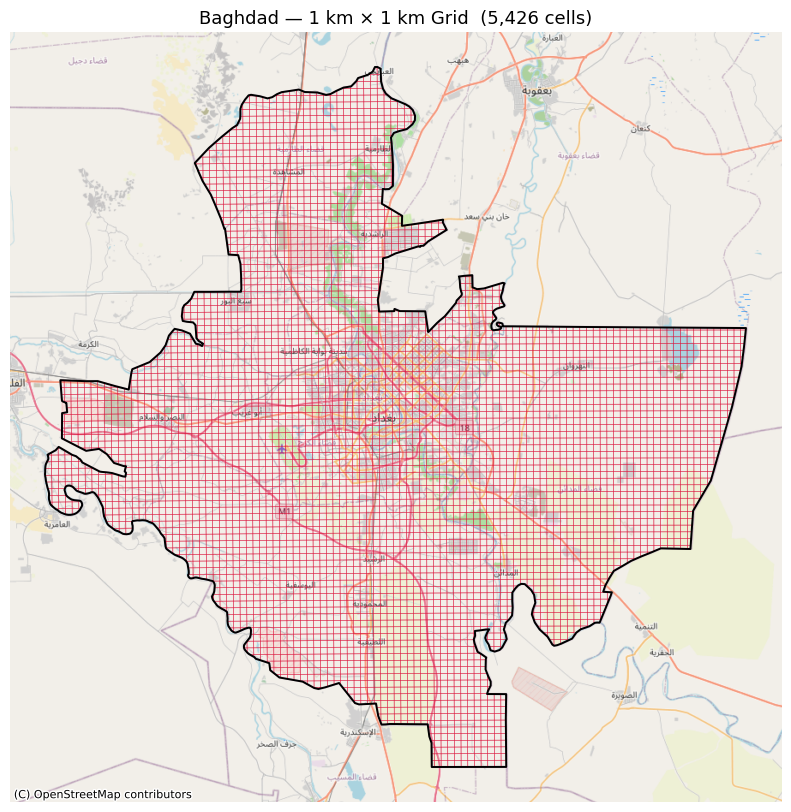

  ✅  Done — 5,426 grid cells  (boundary source: local)

  Buenos Aires  [buenos_aires]  CRS: EPSG:32721
  Boundary source : LOCAL  (data/raw/buenos_aires/city_boundary/buenos_aires_boundary.gpkg)
  Exporting boundary →
    Saved: data/raw/buenos_aires/city_boundary/buenos_aires_boundary.gpkg
    Saved: data/raw/buenos_aires/city_boundary/buenos_aires_boundary.geojson
  Clipping boundary to land →
  Land polygons in bbox : 2
  After sea removal     : 2 polygon(s)
  Lake polygons in bbox : 0
  No lakes in bounding box — land boundary unchanged.
  Exporting clipped boundary →


/Users/sergimarsol/Documentos/0. UNIVERSITAT/1. Imperial/4. Group Design Project/WB Project/venv-geemap/lib/python3.12/site-packages/pyogrio/geopandas.py:382: UserWarning: More than one layer found in 'buenos_aires_boundary.gpkg': 'buenos_aires' (default), 'buenos_aires_boundary'. Specify layer parameter to avoid this warning.
  result = read_func(


    Saved: data/raw/buenos_aires/city_boundary/buenos_aires_boundary_clipped.gpkg
    Saved: data/raw/buenos_aires/city_boundary/buenos_aires_boundary_clipped.geojson
  Grid before clipping : 27,745 cells
  Grid after clipping  : 14,206 cells  (removed 13,539 slivers < 100,000 m²)
  Exporting grid →
    Saved: data/processed/buenos_aires/grid/grid_buenos_aires_1km.gpkg
    Saved: data/processed/buenos_aires/grid/grid_buenos_aires_1km.geojson
    Saved: data/processed/buenos_aires/grid/grid_buenos_aires_1km_centroids.csv  (14,206 rows)
  Generating map →
    Saved: data/processed/buenos_aires/grid/buenos_aires_1km_grid_map.png
    Saved: data/processed/buenos_aires/grid/buenos_aires_1km_grid_map.pdf


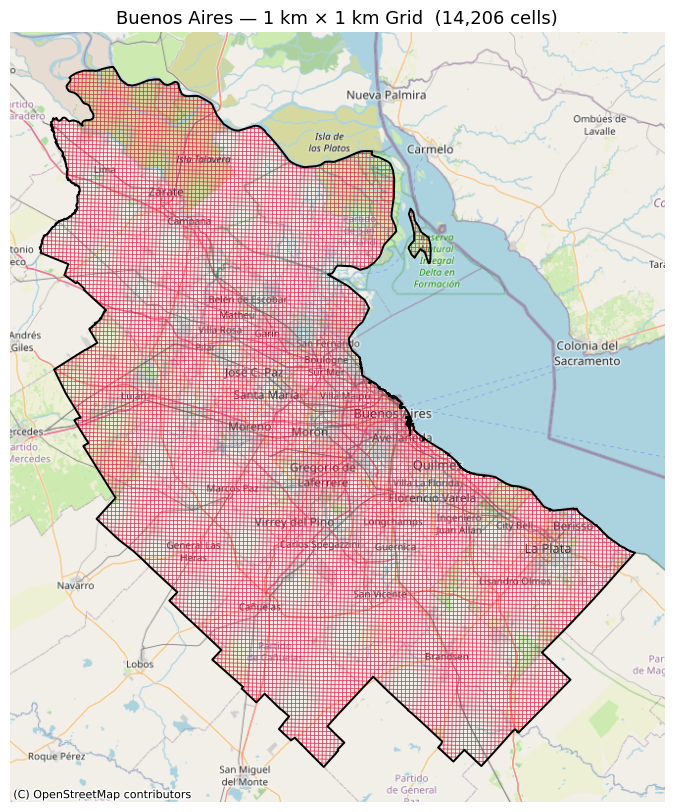

  ✅  Done — 14,206 grid cells  (boundary source: local)

  Cairo  [cairo]  CRS: EPSG:32636
  Boundary source : LOCAL  (data/raw/cairo/city_boundary/cairo_boundary.gpkg)
  Exporting boundary →
    Saved: data/raw/cairo/city_boundary/cairo_boundary.gpkg
    Saved: data/raw/cairo/city_boundary/cairo_boundary.geojson
  Clipping boundary to land →
  Land polygons in bbox : 1
  After sea removal     : 1 polygon(s)
  Lake polygons in bbox : 1
  No lakes overlap boundary — land boundary unchanged.
  Exporting clipped boundary →
    Saved: data/raw/cairo/city_boundary/cairo_boundary_clipped.gpkg
    Saved: data/raw/cairo/city_boundary/cairo_boundary_clipped.geojson


/Users/sergimarsol/Documentos/0. UNIVERSITAT/1. Imperial/4. Group Design Project/WB Project/venv-geemap/lib/python3.12/site-packages/pyogrio/geopandas.py:382: UserWarning: More than one layer found in 'cairo_boundary.gpkg': 'Cairo' (default), 'cairo_boundary'. Specify layer parameter to avoid this warning.
  result = read_func(


  Grid before clipping : 12,192 cells


/Users/sergimarsol/Documentos/0. UNIVERSITAT/1. Imperial/4. Group Design Project/WB Project/venv-geemap/lib/python3.12/site-packages/geopandas/tools/overlay.py:358: UserWarning: `keep_geom_type=True` in overlay resulted in 30 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  result = _collection_extract(result, geom_type, keep_geom_type_warning)


  Grid after clipping  : 7,882 cells  (removed 4,310 slivers < 100,000 m²)
  Exporting grid →
    Saved: data/processed/cairo/grid/grid_cairo_1km.gpkg
    Saved: data/processed/cairo/grid/grid_cairo_1km.geojson
    Saved: data/processed/cairo/grid/grid_cairo_1km_centroids.csv  (7,882 rows)
  Generating map →
    Saved: data/processed/cairo/grid/cairo_1km_grid_map.png
    Saved: data/processed/cairo/grid/cairo_1km_grid_map.pdf


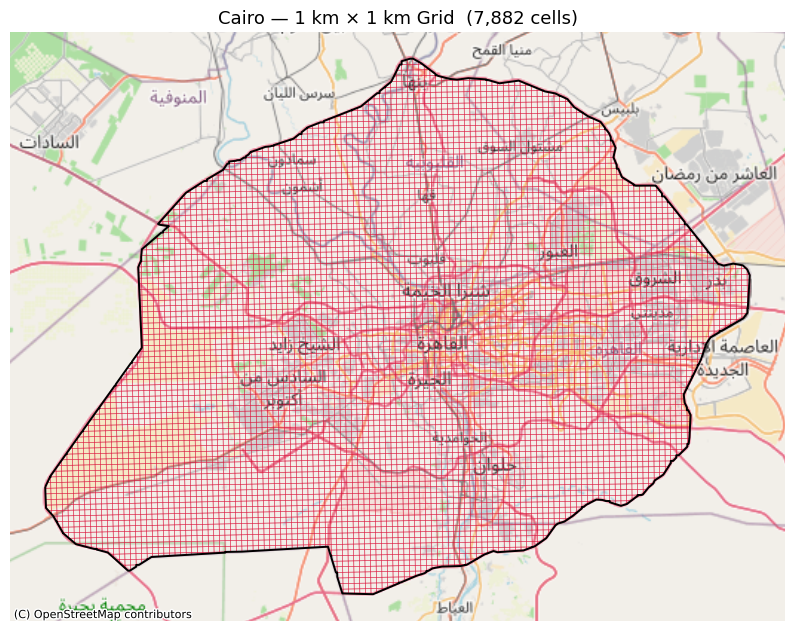

  ✅  Done — 7,882 grid cells  (boundary source: local)

  Cape Town  [cape_town]  CRS: EPSG:32734
  Boundary source : LOCAL  (data/raw/cape_town/city_boundary/cape_town_boundary.gpkg)
  Exporting boundary →
    Saved: data/raw/cape_town/city_boundary/cape_town_boundary.gpkg
    Saved: data/raw/cape_town/city_boundary/cape_town_boundary.geojson
  Clipping boundary to land →
  Land polygons in bbox : 1
  After sea removal     : 1 polygon(s)
  Lake polygons in bbox : 0
  No lakes in bounding box — land boundary unchanged.
  Exporting clipped boundary →
    Saved: data/raw/cape_town/city_boundary/cape_town_boundary_clipped.gpkg
    Saved: data/raw/cape_town/city_boundary/cape_town_boundary_clipped.geojson


/Users/sergimarsol/Documentos/0. UNIVERSITAT/1. Imperial/4. Group Design Project/WB Project/venv-geemap/lib/python3.12/site-packages/pyogrio/geopandas.py:382: UserWarning: More than one layer found in 'cape_town_boundary.gpkg': 'cape_town' (default), 'cape_town_boundary'. Specify layer parameter to avoid this warning.
  result = read_func(


  Grid before clipping : 6,272 cells
  Grid after clipping  : 2,570 cells  (removed 3,702 slivers < 100,000 m²)
  Exporting grid →
    Saved: data/processed/cape_town/grid/grid_cape_town_1km.gpkg
    Saved: data/processed/cape_town/grid/grid_cape_town_1km.geojson
    Saved: data/processed/cape_town/grid/grid_cape_town_1km_centroids.csv  (2,570 rows)
  Generating map →
    Saved: data/processed/cape_town/grid/cape_town_1km_grid_map.png
    Saved: data/processed/cape_town/grid/cape_town_1km_grid_map.pdf


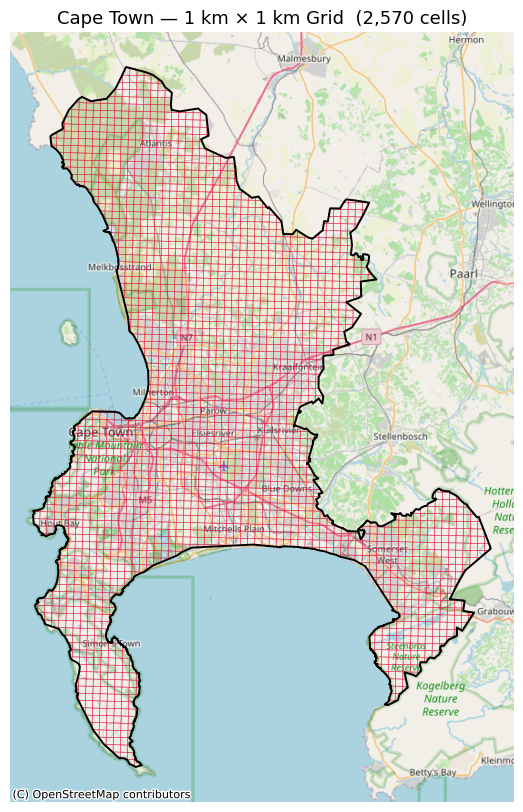

  ✅  Done — 2,570 grid cells  (boundary source: local)

  Dakar  [dakar]  CRS: EPSG:32628
  Boundary source : LOCAL  (data/raw/dakar/city_boundary/dakar_boundary.gpkg)
  Exporting boundary →
    Saved: data/raw/dakar/city_boundary/dakar_boundary.gpkg
    Saved: data/raw/dakar/city_boundary/dakar_boundary.geojson
  Clipping boundary to land →
  Land polygons in bbox : 1
  After sea removal     : 1 polygon(s)
  Lake polygons in bbox : 0
  No lakes in bounding box — land boundary unchanged.
  Exporting clipped boundary →
    Saved: data/raw/dakar/city_boundary/dakar_boundary_clipped.gpkg
    Saved: data/raw/dakar/city_boundary/dakar_boundary_clipped.geojson
  Grid before clipping : 1,440 cells
  Grid after clipping  : 623 cells  (removed 817 slivers < 100,000 m²)
  Exporting grid →
    Saved: data/processed/dakar/grid/grid_dakar_1km.gpkg
    Saved: data/processed/dakar/grid/grid_dakar_1km.geojson
    Saved: data/processed/dakar/grid/grid_dakar_1km_centroids.csv  (623 rows)
  Generating ma

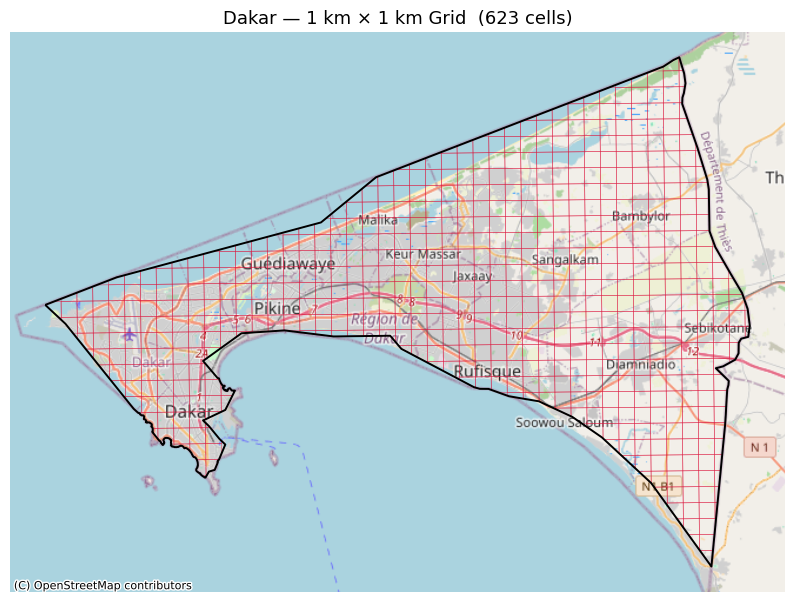

  ✅  Done — 623 grid cells  (boundary source: local)

  Lima  [lima]  CRS: EPSG:32718
  Boundary source : LOCAL  (data/raw/lima/city_boundary/lima_boundary.gpkg)
  Exporting boundary →
    Saved: data/raw/lima/city_boundary/lima_boundary.gpkg
    Saved: data/raw/lima/city_boundary/lima_boundary.geojson
  Clipping boundary to land →
  Land polygons in bbox : 2
  After sea removal     : 1 polygon(s)
  Lake polygons in bbox : 0
  No lakes in bounding box — land boundary unchanged.
  Exporting clipped boundary →
    Saved: data/raw/lima/city_boundary/lima_boundary_clipped.gpkg
    Saved: data/raw/lima/city_boundary/lima_boundary_clipped.geojson
  Grid before clipping : 6,720 cells
  Grid after clipping  : 2,995 cells  (removed 3,725 slivers < 100,000 m²)
  Exporting grid →
    Saved: data/processed/lima/grid/grid_lima_1km.gpkg
    Saved: data/processed/lima/grid/grid_lima_1km.geojson
    Saved: data/processed/lima/grid/grid_lima_1km_centroids.csv  (2,995 rows)
  Generating map →
    Saved:

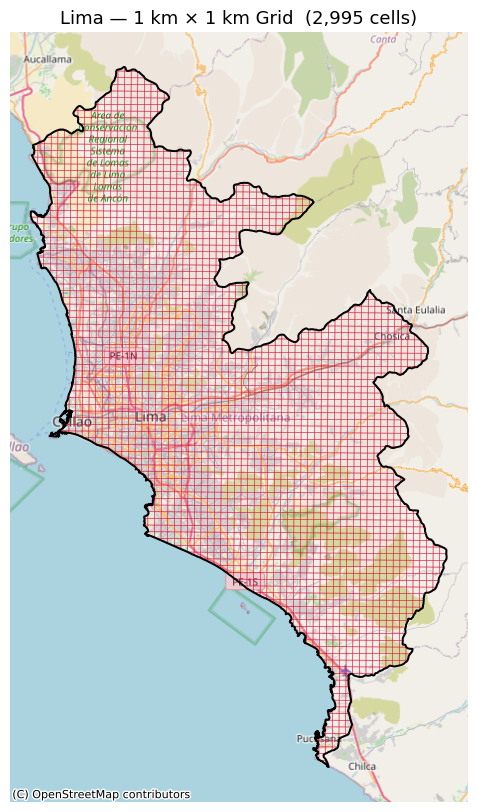

  ✅  Done — 2,995 grid cells  (boundary source: local)

  Los Angeles  [los_angeles]  CRS: EPSG:32611
  Boundary source : LOCAL  (data/raw/los_angeles/city_boundary/los_angeles_boundary.gpkg)
  Exporting boundary →
    Saved: data/raw/los_angeles/city_boundary/los_angeles_boundary.gpkg
    Saved: data/raw/los_angeles/city_boundary/los_angeles_boundary.geojson
  Clipping boundary to land →
  Land polygons in bbox : 4
  After sea removal     : 2 polygon(s)
  Lake polygons in bbox : 0
  No lakes in bounding box — land boundary unchanged.
  Exporting clipped boundary →
    Saved: data/raw/los_angeles/city_boundary/los_angeles_boundary_clipped.gpkg
    Saved: data/raw/los_angeles/city_boundary/los_angeles_boundary_clipped.geojson


/Users/sergimarsol/Documentos/0. UNIVERSITAT/1. Imperial/4. Group Design Project/WB Project/venv-geemap/lib/python3.12/site-packages/pyogrio/geopandas.py:382: UserWarning: More than one layer found in 'los_angeles_boundary.gpkg': 'los_angeles' (default), 'los_angeles_boundary'. Specify layer parameter to avoid this warning.
  result = read_func(


  Grid before clipping : 15,125 cells
  Grid after clipping  : 10,449 cells  (removed 4,676 slivers < 100,000 m²)
  Exporting grid →
    Saved: data/processed/los_angeles/grid/grid_los_angeles_1km.gpkg
    Saved: data/processed/los_angeles/grid/grid_los_angeles_1km.geojson
    Saved: data/processed/los_angeles/grid/grid_los_angeles_1km_centroids.csv  (10,449 rows)
  Generating map →
    Saved: data/processed/los_angeles/grid/los_angeles_1km_grid_map.png
    Saved: data/processed/los_angeles/grid/los_angeles_1km_grid_map.pdf


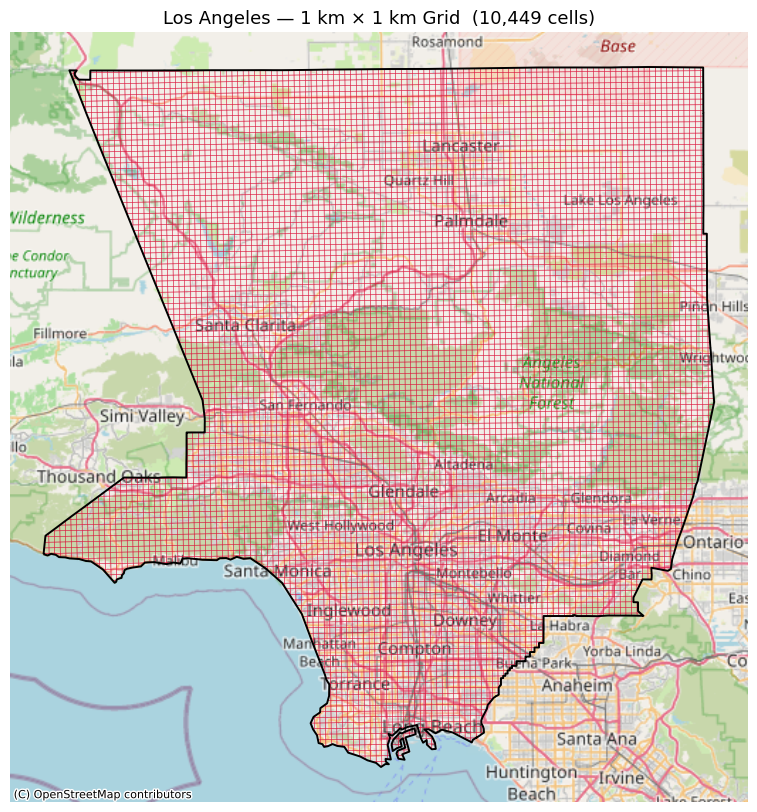

  ✅  Done — 10,449 grid cells  (boundary source: local)

  Madrid  [madrid]  CRS: EPSG:32630
  Boundary source : LOCAL  (data/raw/madrid/city_boundary/madrid_boundary.gpkg)
  Exporting boundary →
    Saved: data/raw/madrid/city_boundary/madrid_boundary.gpkg
    Saved: data/raw/madrid/city_boundary/madrid_boundary.geojson
  Clipping boundary to land →
  Land polygons in bbox : 1
  After sea removal     : 1 polygon(s)
  Lake polygons in bbox : 3
  No lakes overlap boundary — land boundary unchanged.
  Exporting clipped boundary →
    Saved: data/raw/madrid/city_boundary/madrid_boundary_clipped.gpkg
    Saved: data/raw/madrid/city_boundary/madrid_boundary_clipped.geojson
  Grid before clipping : 18,590 cells
  Grid after clipping  : 8,284 cells  (removed 10,306 slivers < 100,000 m²)
  Exporting grid →
    Saved: data/processed/madrid/grid/grid_madrid_1km.gpkg
    Saved: data/processed/madrid/grid/grid_madrid_1km.geojson
    Saved: data/processed/madrid/grid/grid_madrid_1km_centroids.csv  

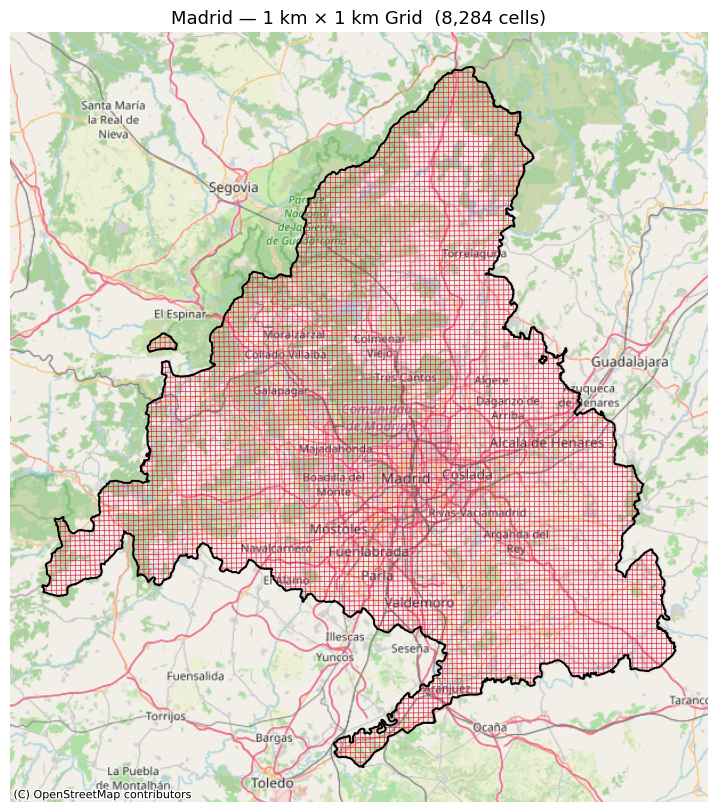

  ✅  Done — 8,284 grid cells  (boundary source: local)

  Mexico City  [mexico_city]  CRS: EPSG:32614
  Boundary source : LOCAL  (data/raw/mexico_city/city_boundary/mexico_city_boundary.gpkg)
  Exporting boundary →
    Saved: data/raw/mexico_city/city_boundary/mexico_city_boundary.gpkg
    Saved: data/raw/mexico_city/city_boundary/mexico_city_boundary.geojson
  Clipping boundary to land →
  Land polygons in bbox : 1
  After sea removal     : 1 polygon(s)
  Lake polygons in bbox : 1
  No lakes overlap boundary — land boundary unchanged.
  Exporting clipped boundary →
    Saved: data/raw/mexico_city/city_boundary/mexico_city_boundary_clipped.gpkg
    Saved: data/raw/mexico_city/city_boundary/mexico_city_boundary_clipped.geojson
  Grid before clipping : 13,986 cells
  Grid after clipping  : 8,069 cells  (removed 5,917 slivers < 100,000 m²)
  Exporting grid →
    Saved: data/processed/mexico_city/grid/grid_mexico_city_1km.gpkg
    Saved: data/processed/mexico_city/grid/grid_mexico_city_1km

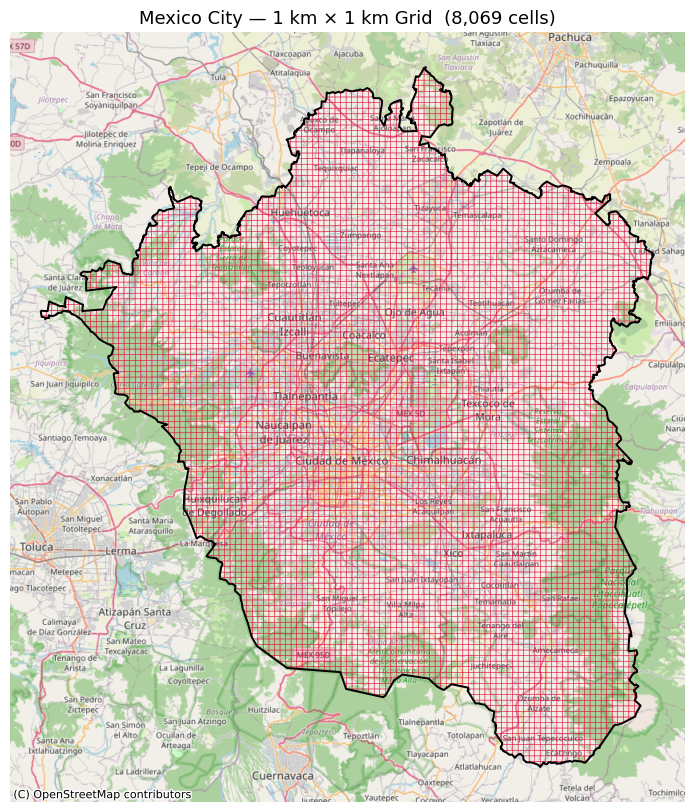

  ✅  Done — 8,069 grid cells  (boundary source: local)

  Mumbai  [mumbai]  CRS: EPSG:32643
  Boundary source : LOCAL  (data/raw/mumbai/city_boundary/mumbai_boundary.gpkg)
  Exporting boundary →
    Saved: data/raw/mumbai/city_boundary/mumbai_boundary.gpkg
    Saved: data/raw/mumbai/city_boundary/mumbai_boundary.geojson
  Clipping boundary to land →
  Land polygons in bbox : 1
  After sea removal     : 1 polygon(s)
  Lake polygons in bbox : 0
  No lakes in bounding box — land boundary unchanged.
  Exporting clipped boundary →
    Saved: data/raw/mumbai/city_boundary/mumbai_boundary_clipped.gpkg
    Saved: data/raw/mumbai/city_boundary/mumbai_boundary_clipped.geojson
  Grid before clipping : 7,425 cells
  Grid after clipping  : 4,361 cells  (removed 3,064 slivers < 100,000 m²)
  Exporting grid →
    Saved: data/processed/mumbai/grid/grid_mumbai_1km.gpkg
    Saved: data/processed/mumbai/grid/grid_mumbai_1km.geojson
    Saved: data/processed/mumbai/grid/grid_mumbai_1km_centroids.csv  (4,3

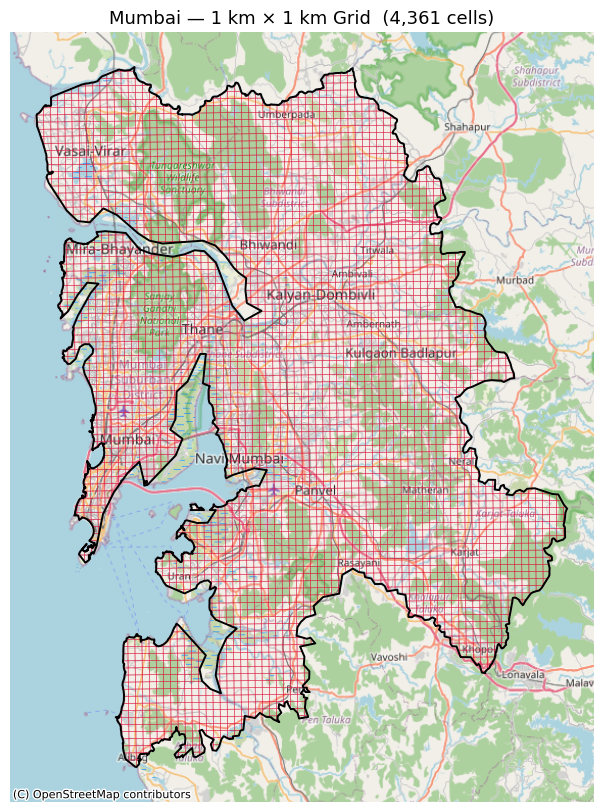

  ✅  Done — 4,361 grid cells  (boundary source: local)

  New York  [new_york]  CRS: EPSG:32618
  Boundary source : LOCAL  (data/raw/new_york/city_boundary/new_york_boundary.gpkg)
  Exporting boundary →
    Saved: data/raw/new_york/city_boundary/new_york_boundary.gpkg
    Saved: data/raw/new_york/city_boundary/new_york_boundary.geojson
  Clipping boundary to land →
  Land polygons in bbox : 3
  After sea removal     : 2 polygon(s)
  Lake polygons in bbox : 0
  No lakes in bounding box — land boundary unchanged.
  Exporting clipped boundary →
    Saved: data/raw/new_york/city_boundary/new_york_boundary_clipped.gpkg
    Saved: data/raw/new_york/city_boundary/new_york_boundary_clipped.geojson
  Grid before clipping : 2,209 cells
  Grid after clipping  : 861 cells  (removed 1,348 slivers < 100,000 m²)
  Exporting grid →
    Saved: data/processed/new_york/grid/grid_new_york_1km.gpkg
    Saved: data/processed/new_york/grid/grid_new_york_1km.geojson
    Saved: data/processed/new_york/grid/gri

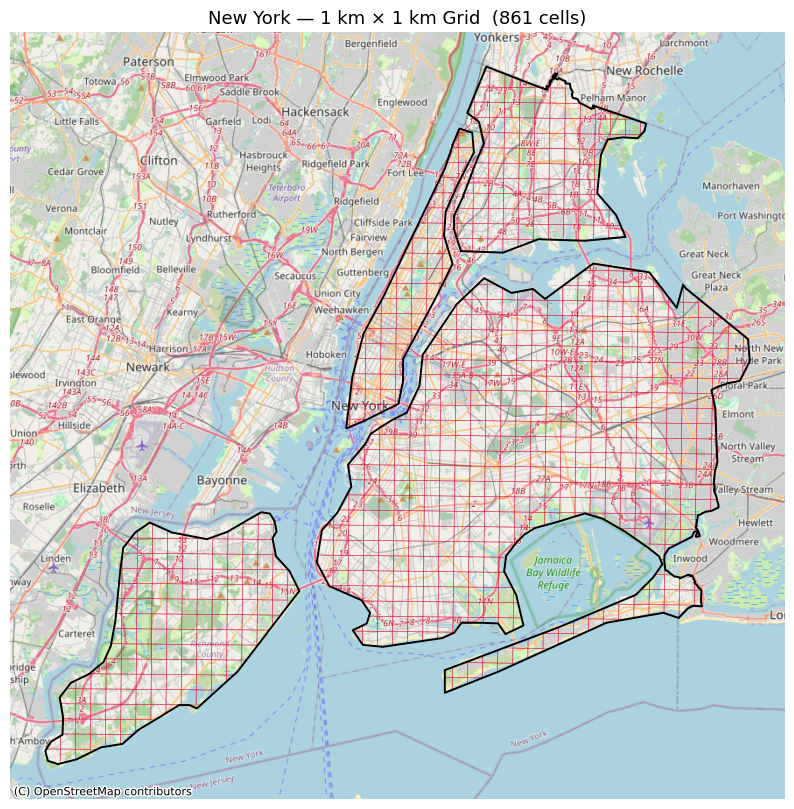

  ✅  Done — 861 grid cells  (boundary source: local)

  Santiago  [santiago]  CRS: EPSG:32719
  Boundary source : LOCAL  (data/raw/santiago/city_boundary/santiago_boundary.gpkg)
  Exporting boundary →
    Saved: data/raw/santiago/city_boundary/santiago_boundary.gpkg
    Saved: data/raw/santiago/city_boundary/santiago_boundary.geojson
  Clipping boundary to land →
  Land polygons in bbox : 1
  After sea removal     : 1 polygon(s)
  Lake polygons in bbox : 0
  No lakes in bounding box — land boundary unchanged.
  Exporting clipped boundary →
    Saved: data/raw/santiago/city_boundary/santiago_boundary_clipped.gpkg
    Saved: data/raw/santiago/city_boundary/santiago_boundary_clipped.geojson
  Grid before clipping : 27,180 cells
  Grid after clipping  : 15,719 cells  (removed 11,461 slivers < 100,000 m²)
  Exporting grid →
    Saved: data/processed/santiago/grid/grid_santiago_1km.gpkg
    Saved: data/processed/santiago/grid/grid_santiago_1km.geojson
    Saved: data/processed/santiago/grid/

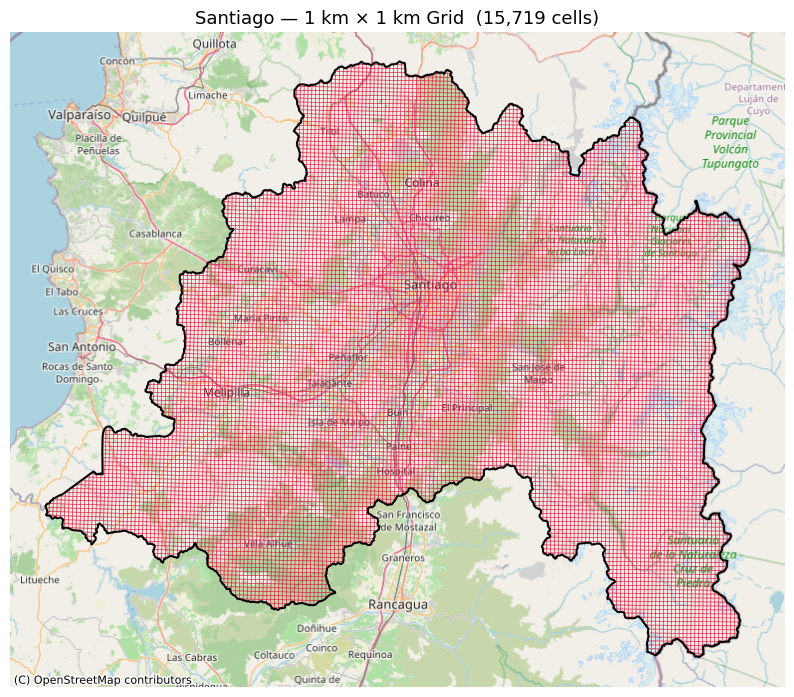

  ✅  Done — 15,719 grid cells  (boundary source: local)

  Yangon  [yangon]  CRS: EPSG:32647
  Boundary source : LOCAL  (data/raw/yangon/city_boundary/yangon_boundary.gpkg)
  Exporting boundary →
    Saved: data/raw/yangon/city_boundary/yangon_boundary.gpkg
    Saved: data/raw/yangon/city_boundary/yangon_boundary.geojson
  Clipping boundary to land →
  Land polygons in bbox : 1


/Users/sergimarsol/Documentos/0. UNIVERSITAT/1. Imperial/4. Group Design Project/WB Project/venv-geemap/lib/python3.12/site-packages/pyogrio/geopandas.py:382: UserWarning: More than one layer found in 'yangon_boundary.gpkg': 'Yangon' (default), 'yangon_boundary'. Specify layer parameter to avoid this warning.
  result = read_func(


  After sea removal     : 1 polygon(s)
  Lake polygons in bbox : 0
  No lakes in bounding box — land boundary unchanged.
  Exporting clipped boundary →
    Saved: data/raw/yangon/city_boundary/yangon_boundary_clipped.gpkg
    Saved: data/raw/yangon/city_boundary/yangon_boundary_clipped.geojson
  Grid before clipping : 1,480 cells
  Grid after clipping  : 801 cells  (removed 679 slivers < 100,000 m²)
  Exporting grid →
    Saved: data/processed/yangon/grid/grid_yangon_1km.gpkg
    Saved: data/processed/yangon/grid/grid_yangon_1km.geojson
    Saved: data/processed/yangon/grid/grid_yangon_1km_centroids.csv  (801 rows)
  Generating map →
    Saved: data/processed/yangon/grid/yangon_1km_grid_map.png
    Saved: data/processed/yangon/grid/yangon_1km_grid_map.pdf


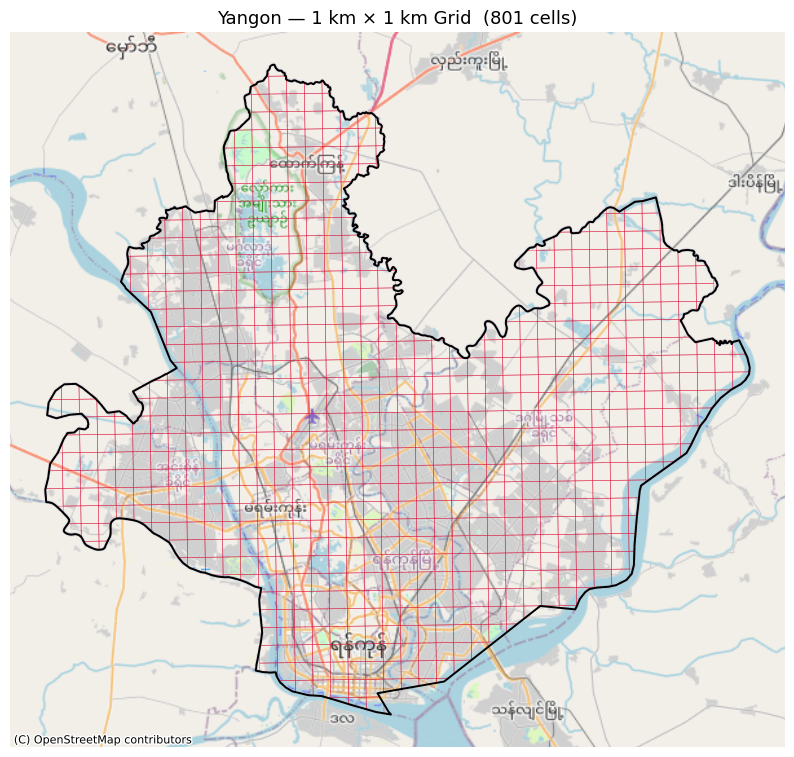

  ✅  Done — 801 grid cells  (boundary source: local)

Batch complete: 15/15 cities processed successfully.


In [6]:
# Set to False to skip PNG/PDF map export
MAKE_PLOTS = True

results = {}

for city_slug, config in CITIES.items():
    print()
    print("=" * 70)
    print(f"  {config['label']}  [{city_slug}]  CRS: {CITY_CRS[city_slug]}")
    print("=" * 70)
    try:
        results[city_slug] = process_city(city_slug, config, make_plot=MAKE_PLOTS)
        n_cells = len(results[city_slug]["grid"])
        source  = results[city_slug]["source"]
        print(f"  ✅  Done — {n_cells:,} grid cells  (boundary source: {source})")
    except Exception as e:
        print(f"  ⚠️  Failed: {e}")

print()
print(f"Batch complete: {len(results)}/{len(CITIES)} cities processed successfully.")

## 5. Rerun a Single City (Optional)

Use this section to debug or regenerate one city without rerunning the full batch.
Uncomment the block, set the city slug, and run.

In [7]:
# city_slug = "cape_town"
# result    = process_city(city_slug, CITIES[city_slug], make_plot=True)
# print(result["boundary"])
# print(result["grid"].head())

print("Single-city rerun cell ready — uncomment and set city_slug to use.")

Single-city rerun cell ready — uncomment and set city_slug to use.


## 6. Output Summary

Produces a summary table of all cities processed and lists every file written.

In [8]:
if not results:
    print("No results to summarise — run Section 4 first.")
else:
    # ── Build summary table ────────────────────────────────────────────────────
    rows = []
    for city_slug, result in results.items():
        rows.append({
            "city_slug"    : city_slug,
            "label"        : CITIES[city_slug]["label"],
            "grid_cells"   : len(result["grid"]),
            "boundary_src" : result["source"],
            "projected_crs": CITY_CRS[city_slug],
        })

    summary_df = (
        pd.DataFrame(rows)
        .sort_values("city_slug")
        .reset_index(drop=True)
    )

    print("Grid generation summary:")
    print(summary_df.to_string(index=False))
    print(f"\nTotal cities      : {len(summary_df)}")
    print(f"Total grid cells  : {summary_df['grid_cells'].sum():,}")
    print(f"From local files  : {(summary_df['boundary_src'] == 'local').sum()}")
    print(f"Downloaded from OSM: {(summary_df['boundary_src'] == 'osm').sum()}")

    # ── List all output files per city ────────────────────────────────────────
    print("\nFiles written per city:")
    for city_slug in sorted(results.keys()):
        raw_dir   = raw_boundary_dir(city_slug)
        proc_dir  = processed_dir(city_slug)
        all_files = sorted(raw_dir.glob("*")) + sorted(proc_dir.glob("*"))
        print(f"\n  {city_slug}:")
        for path in all_files:
            size_kb = path.stat().st_size / 1024
            print(f"    {str(path.relative_to(PROJECT_ROOT)):<65} {size_kb:>8.1f} KB")

Grid generation summary:
   city_slug        label  grid_cells boundary_src projected_crs
       abuja        Abuja        1859        local    EPSG:32632
     algiers      Algiers         814        local    EPSG:32631
     baghdad      Baghdad        5426        local    EPSG:32638
buenos_aires Buenos Aires       14206        local    EPSG:32721
       cairo        Cairo        7882        local    EPSG:32636
   cape_town    Cape Town        2570        local    EPSG:32734
       dakar        Dakar         623        local    EPSG:32628
        lima         Lima        2995        local    EPSG:32718
 los_angeles  Los Angeles       10449        local    EPSG:32611
      madrid       Madrid        8284        local    EPSG:32630
 mexico_city  Mexico City        8069        local    EPSG:32614
      mumbai       Mumbai        4361        local    EPSG:32643
    new_york     New York         861        local    EPSG:32618
    santiago     Santiago       15719        local    EPSG:32719
